In [115]:

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scanpy as sc
import palettable
import anndata as ad
import scanpy.external as sce
import pandas as pd

# settings

In [3]:
sc.set_figure_params(vector_friendly=False,format='pdf',transparent=True,dpi=200)

sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
cls_cmp = palettable.cartocolors.qualitative.Bold_10.mpl_colors

# data loading

In [101]:
data_path = 'simulation_data/'

data_file = 'simulation2.h5ad'
adata = ad.read_h5ad(data_path+data_file)


In [95]:
4000/4735

0.8447729672650475

In [102]:
sc.pp.subsample(adata,0.844)

In [104]:
adata

AnnData object with n_obs × n_vars = 3996 × 1000
    obs: 'gt_ct', 'region_id', 'batch'
    uns: 'gt_ct_colors', 'region_id_colors'
    obsm: 'X_pca', 'X_phate', 'X_tsne', 'X_umap', 'spatial'

In [105]:
adata.obs['gt_ct'].cat.reorder_categories(['group '+str(i+1) for i in range(5)],inplace=True)

/tmp/ipykernel_4515/3095504374.py:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['gt_ct'].cat.reorder_categories(['group '+str(i+1) for i in range(5)],inplace=True)


In [106]:
adata.obs['gt_ct']

Cell2566-3    group 3
Cell2357-3    group 4
Cell3998-4    group 5
Cell1780-3    group 5
Cell299-3     group 4
               ...   
Cell3973-4    group 5
Cell2801-2    group 4
Cell4310-1    group 5
Cell4969-0    group 1
Cell1584-0    group 3
Name: gt_ct, Length: 3996, dtype: category
Categories (5, object): ['group 1', 'group 2', 'group 3', 'group 4', 'group 5']

In [107]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# plot

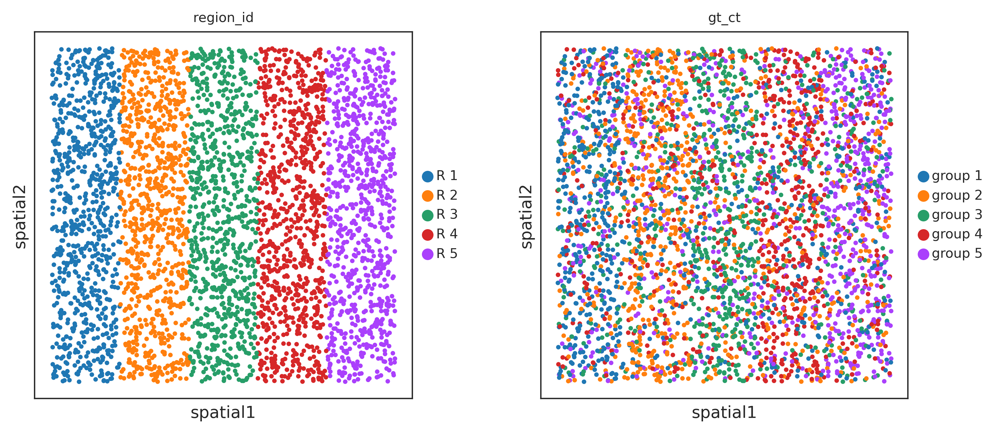

In [109]:
ax = sc.pl.embedding(adata,basis="spatial",color=['region_id','gt_ct'],show=False)
plt.gca().set_aspect('equal', adjustable='box') 

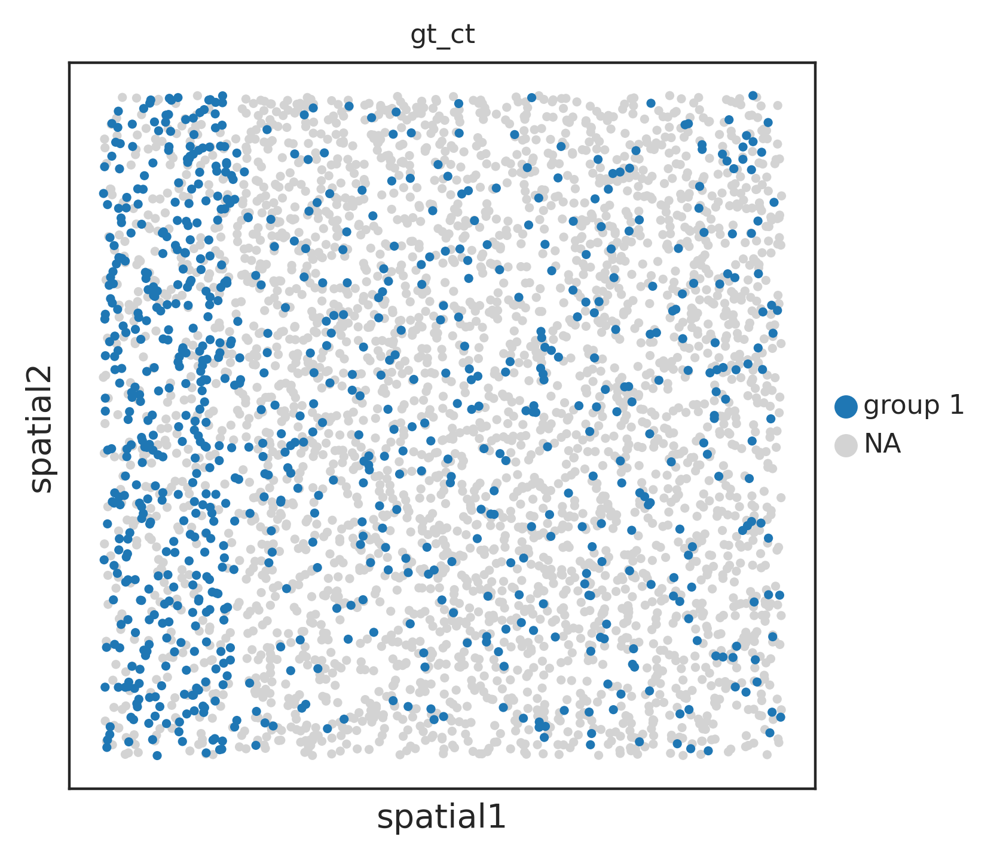

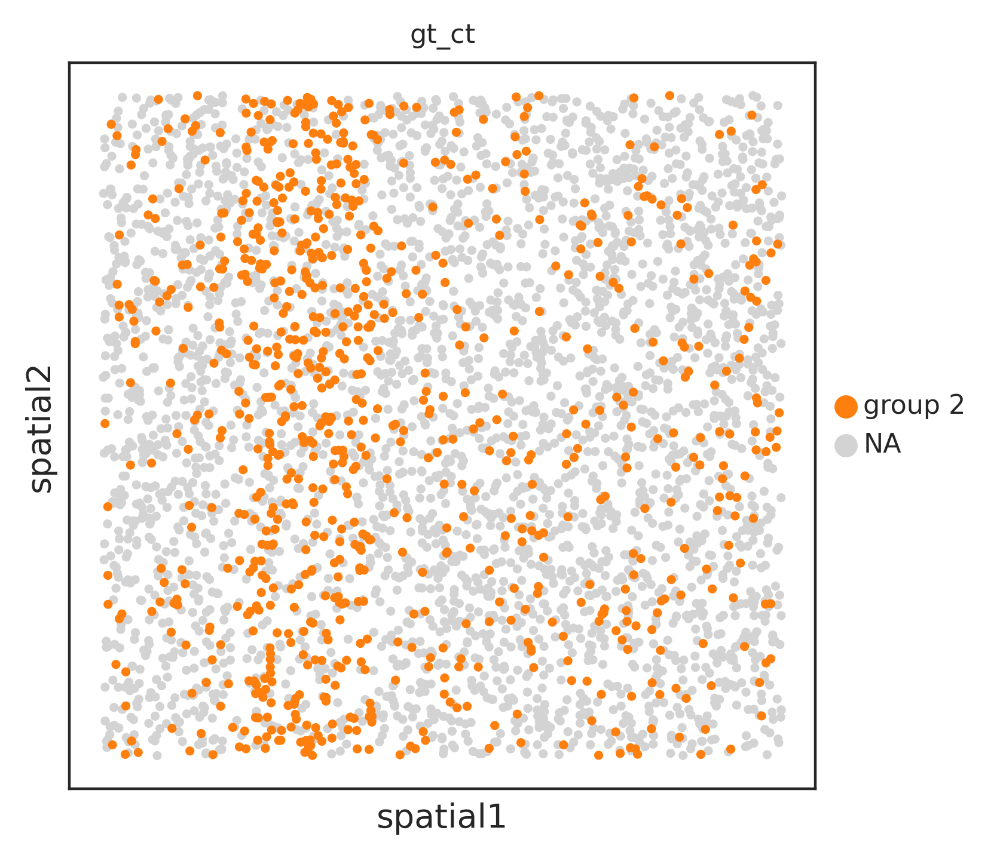

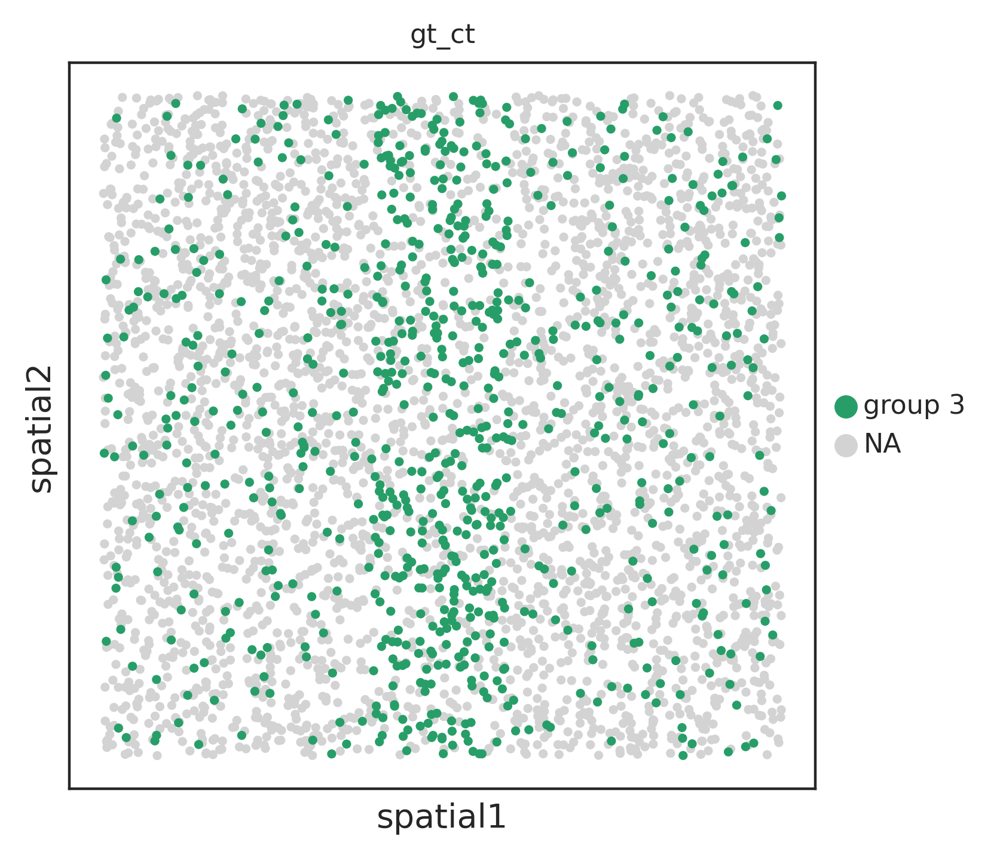

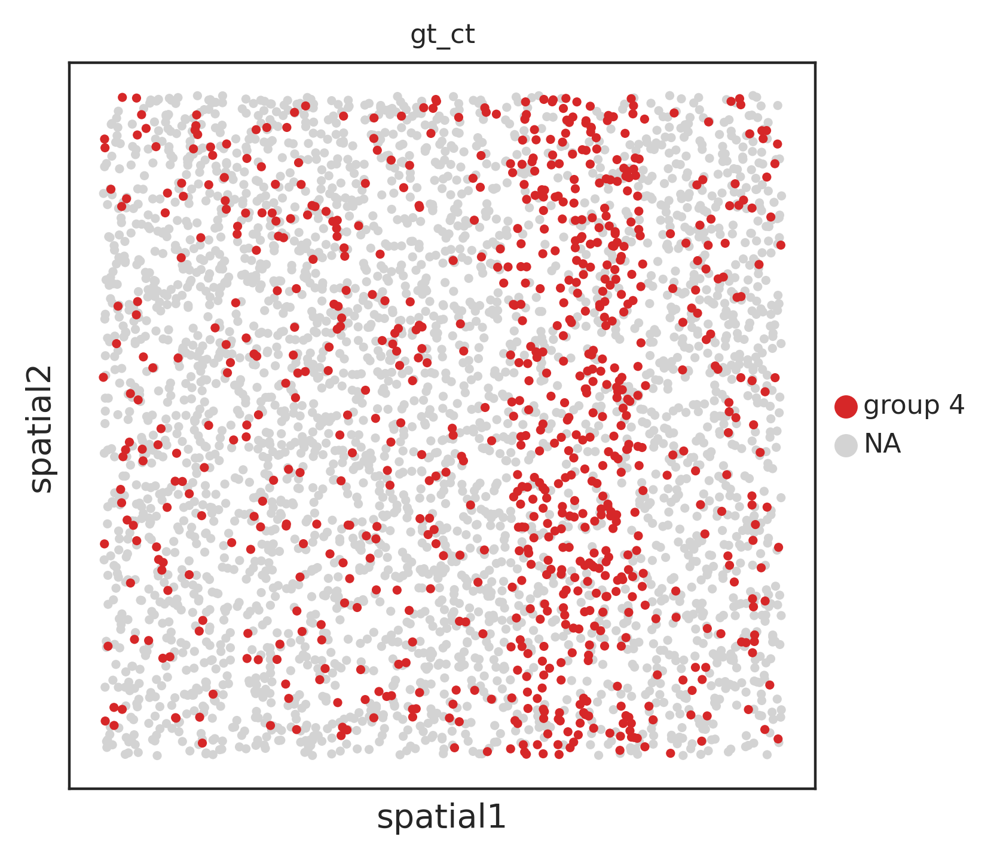

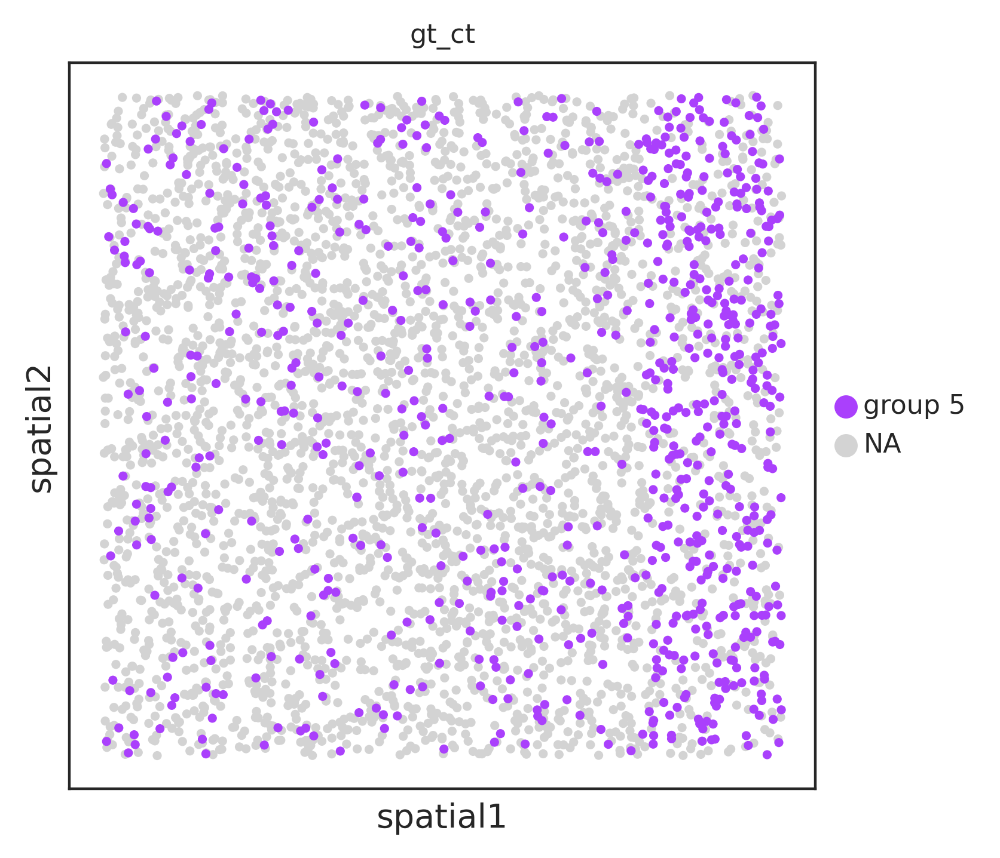

In [110]:
for i in range(5):
    sc.pl.embedding(adata,basis="spatial",color=['gt_ct'],groups='group {0}'.format(i+1))
# plt.gca().set_aspect('equal', adjustable='box') 

In [116]:
pd_dict = {
    'x':[],
    'y':[],
    'region':[],
    'celltype':[]
}
spatial_mat = adata.obsm['spatial']
region_array = adata.obs['region_id']
ct_array = adata.obs['gt_ct']

for i in range(adata.shape[0]):
    cur_x = spatial_mat[i,0]
    cur_y = spatial_mat[i,1]    
    cur_region = region_array[i]
    cur_ct = ct_array[i]
    pd_dict['x'].append(cur_x)
    pd_dict['y'].append(cur_y)    
    pd_dict['region'].append(cur_region)    
    pd_dict['celltype'].append(cur_ct)    
pd_df = pd.DataFrame(pd_dict)

In [120]:
adata.uns['gt_ct_colors']

array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc'],
      dtype=object)

[]

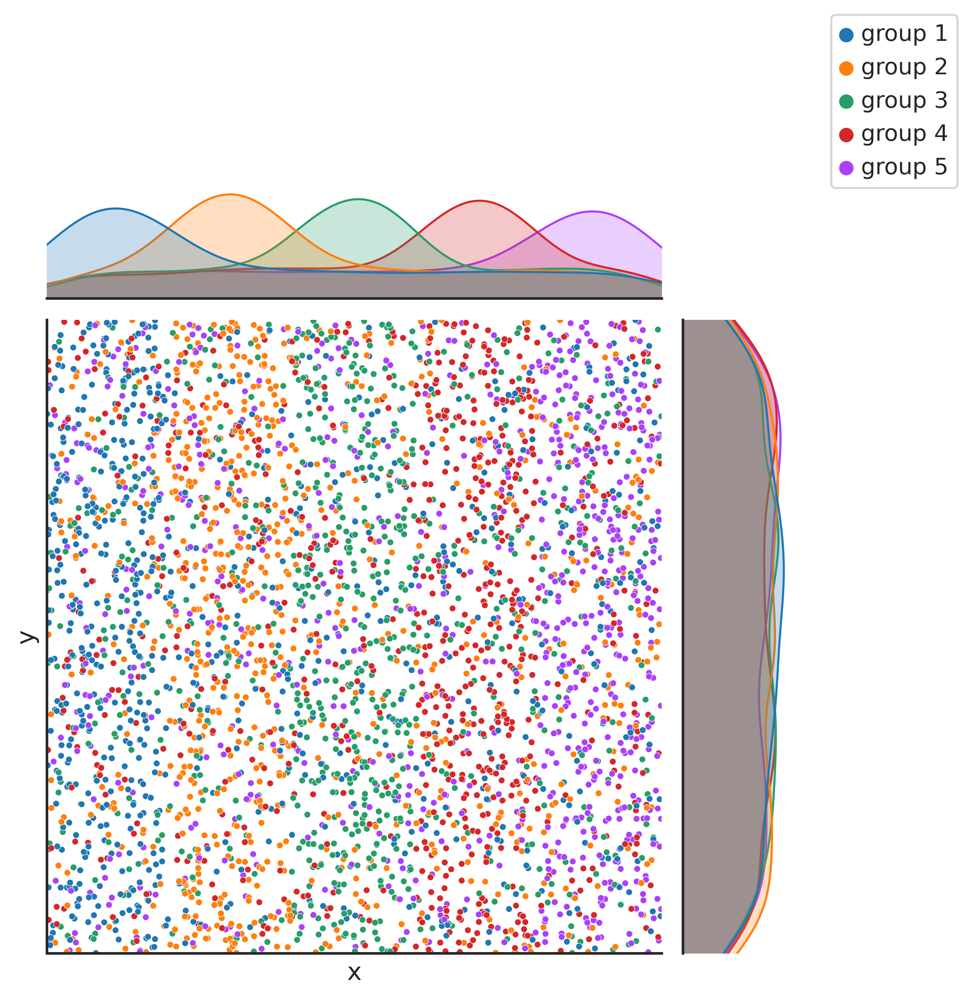

In [159]:
import seaborn as sns
sns.set_theme(style="ticks")

# Load the penguins dataset
# penguins = sns.load_dataset("penguins")

# Show the joint distribution using kernel density estimation
# fig,ax = plt.subplots(1,1)
g = sns.jointplot(
    data=pd_df,
    x="x", y="y", hue="celltype",
#     kind="scatter",
#     kind="reg",
    
    palette=list(adata.uns['gt_ct_colors']),
    hue_order = np.array(adata.obs['gt_ct'].cat.categories),
    xlim=(0,100),
    ylim=(0,100),
    s=10,
)
# g.get_legend().remove()
g.ax_joint.legend(bbox_to_anchor=(1.5, 1.5))
g.ax_joint.set_xticks([])
g.ax_joint.set_yticks([])

# g.ax_joint
# plt.legend(loc = 'upper right')

# ground distance

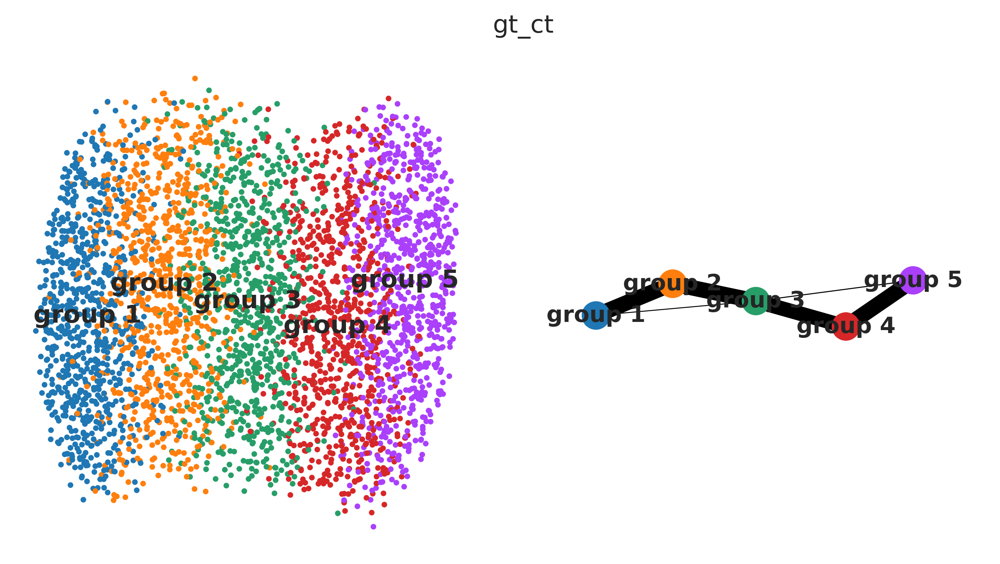

In [160]:
cls_key = 'gt_ct'
sc.tl.paga(adata,groups=cls_key)
sc.pl.paga_compare(adata,basis='X_umap')

In [161]:
gd_method = 'paga_guided_umap'
gd = get_ground_distance(adata,method=gd_method,cls_key=None,embed_key=None)  


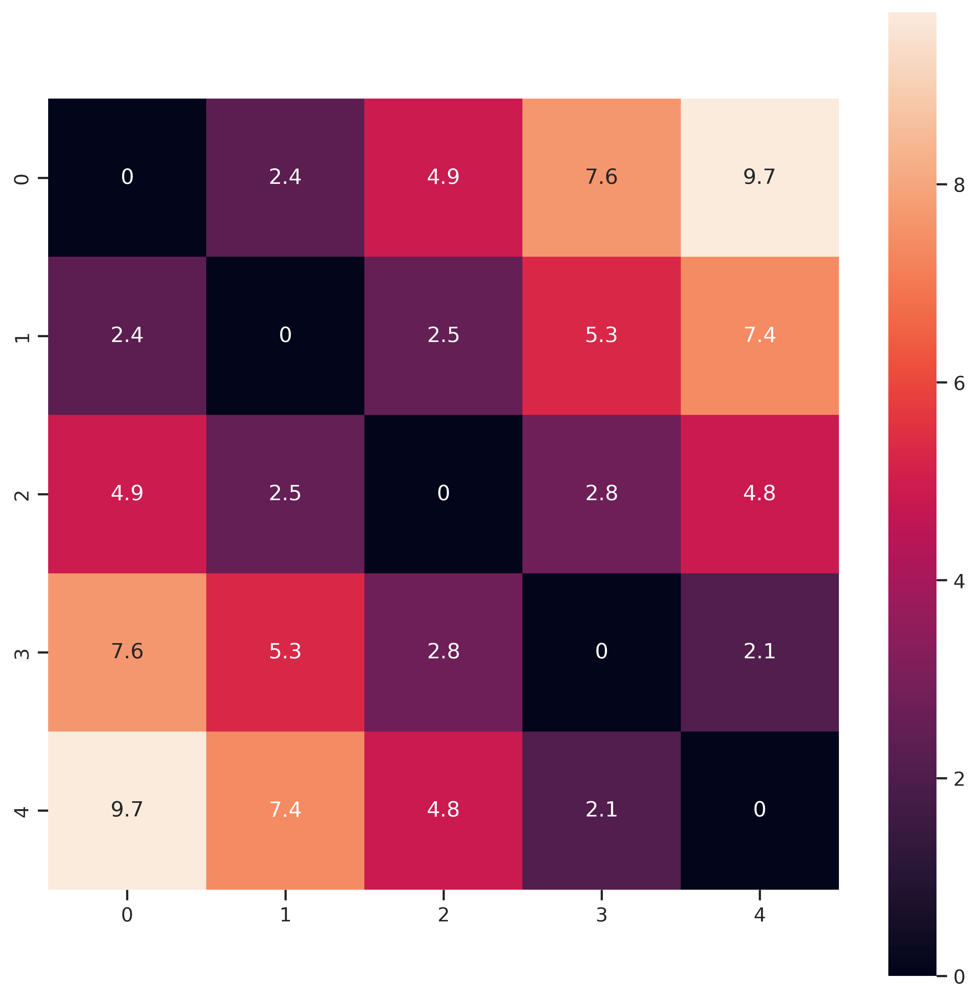

In [162]:
plot_matrix(gd)

# ME

In [73]:
knn = 10
spatial_var='spatial'
ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 

MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 


knn search time cost 0.00990748405456543 s
0 MEs,time cost 1.9073486328125e-06 s, 3788 MEs, 7.22503662109375e-06s left
1000 MEs,time cost 0.14895367622375488 s, 2788 MEs, 0.41528284931182863s left
2000 MEs,time cost 0.1632554531097412 s, 1788 MEs, 0.29190075016021727s left
3000 MEs,time cost 0.14957141876220703 s, 788 MEs, 0.11786227798461914s left


array([[2., 0., 4., 3., 1.],
       [0., 4., 0., 5., 1.],
       [1., 0., 2., 1., 6.],
       ...,
       [2., 1., 1., 4., 2.],
       [5., 1., 1., 1., 2.],
       [1., 2., 2., 0., 5.]])

In [163]:
def get_EMDmat(adata,ME_knn):
    cls_key='gt_ct'
    knn=ME_knn #counting knn nearest cell to make frequency
    gd_method = 'paga_guided_umap'


    embed_key=None



    spatial_var='spatial'
    heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)
    ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 
    MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 
 
    use_cls = cls_key
 


    adata_phEMD = MED_phEMD(
        adata.copy(),
        GD_method='paga',
        MED_knn=knn,
        CT_obs=use_cls,
        ifspatialplot=False,
        OT_method='pyemd',
        ME_precompyted=True,
        GD_precomputed=True
    )


    # get ME EMD neighbor
    emd_distmat = adata_phEMD.obsm['X_ME_EMD_mat']
    return emd_distmat

In [164]:
from scipy.stats import spearmanr

def get_ME_pt_cor(adata,EMD_knn,emd_distmat):
    dummy_X = np.arange(adata.shape[0]).reshape(-1,1)

    def dist_fun(x1,x2,dist_mat=emd_distmat):
        return dist_mat[int(x1[0]),int(x2[0])]

    adata.obsm['dummy_X'] = dummy_X
    sc.pp.neighbors(adata,use_rep='dummy_X',metric=dist_fun,n_neighbors=EMD_knn)
    adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

    sc.tl.diffmap(adata,neighbors_key='neighbors_EMD')
    sc.tl.umap(adata,neighbors_key='neighbors_EMD')
    
    
    spearman_list = []
    for ir in range(400):
        adata.uns['iroot'] = ir
        sc.tl.dpt(adata)
        dpt_pt = np.nan_to_num(adata.obs['dpt_pseudotime'])
        cur_spearman = spearmanr(dpt_pt,adata.obsm['spatial'][:,0])[0]
        spearman_list.append(cur_spearman)
    
    print('ME_knn: {0}, EMD_knn: {1}, spearman: {2}'.format(ME_knn,EMD_knn,np.max(spearman_list)))
    sc.pl.diffmap(adata,color=['region_id','dpt_pseudotime'])
    sc.pl.umap(adata,color=['region_id','dpt_pseudotime'])
    
    adata.uns['test'] = 1
    return spearman_list

### SOTIP embedding

knn search time cost 0.013900041580200195 s
0 MEs,time cost 1.9073486328125e-06 s, 3996 MEs, 7.62176513671875e-06s left
1000 MEs,time cost 0.18134808540344238 s, 2996 MEs, 0.5433188638687134s left
2000 MEs,time cost 0.1653735637664795 s, 1996 MEs, 0.3300856332778931s left
3000 MEs,time cost 0.1745753288269043 s, 996 MEs, 0.17387702751159667s left
0 1637673575.8803132
100 12.990841627120972
200 12.62825083732605
300 12.319973468780518
400 11.985248327255249
500 11.665732860565186
600 11.31521201133728
700 10.969662427902222
800 10.680800914764404
900 10.374902486801147
1000 10.02894902229309
1100 9.701870679855347
1200 9.382897853851318
1300 9.061630487442017
1400 8.696118354797363
1500 8.369496583938599
1600 8.028043508529663
1700 7.700605392456055
1800 7.410809278488159
1900 7.067316055297852
2000 6.726712465286255
2100 6.41878342628479
2200 6.088173866271973
2300 5.755811929702759
2400 5.4338390827178955
2500 5.113731861114502
2600 4.78221869468689
2700 4.438781023025513
2800 4.09781

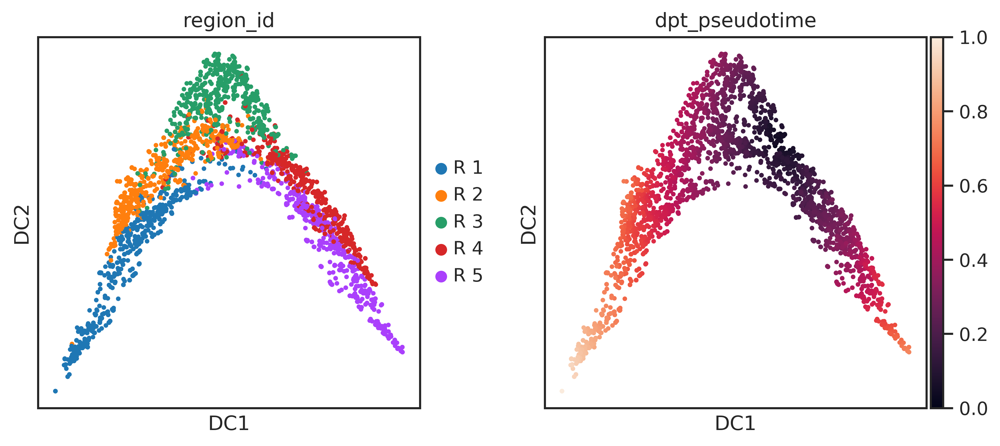

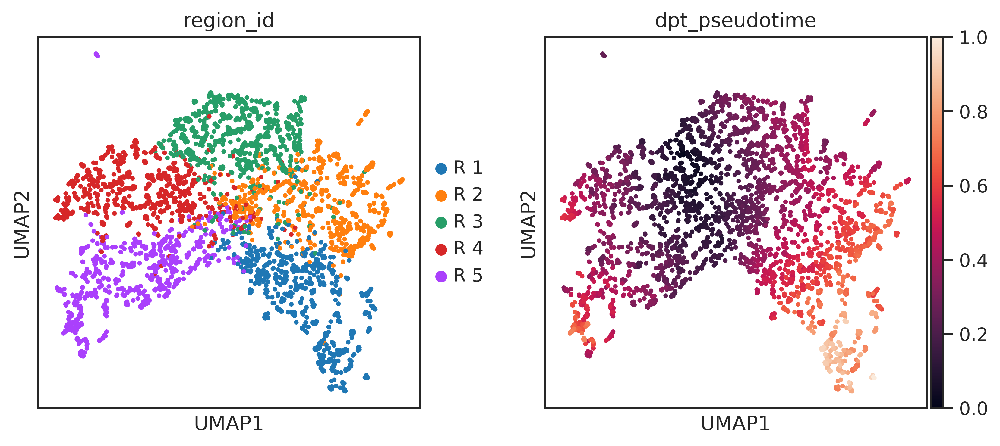

In [165]:
ME_knn = 20
EMD_knn = 20
emdmat = get_EMDmat(adata,ME_knn)

    

cur_corr_list = get_ME_pt_cor(adata,EMD_knn,emdmat)

        

### NUCC embedding

In [ ]:
ME_knn = 20
EMD_knn = 20
ME_var_names_np_unique = np.unique(adata.obs[cls_key]) 
spatial_var = 'spatial'
MED(adata,use_cls=cls_key,nn=ME_knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 


sc.pp.neighbors(adata,use_rep='ME',n_neighbors=EMD_knn)
adata.uns['neighbors_CN'] = adata.uns['neighbors'].copy()
sc.tl.diffmap(adata,neighbors_key='neighbors_CN')
sc.tl.umap(adata,neighbors_key='neighbors_CN')

knn search time cost 0.013921737670898438 s
0 MEs,time cost 2.384185791015625e-06 s, 3996 MEs, 9.527206420898438e-06s left
1000 MEs,time cost 0.17955398559570312 s, 2996 MEs, 0.5379437408447265s left
2000 MEs,time cost 0.17009282112121582 s, 1996 MEs, 0.3395052709579468s left
3000 MEs,time cost 0.16116857528686523 s, 996 MEs, 0.16052390098571778s left


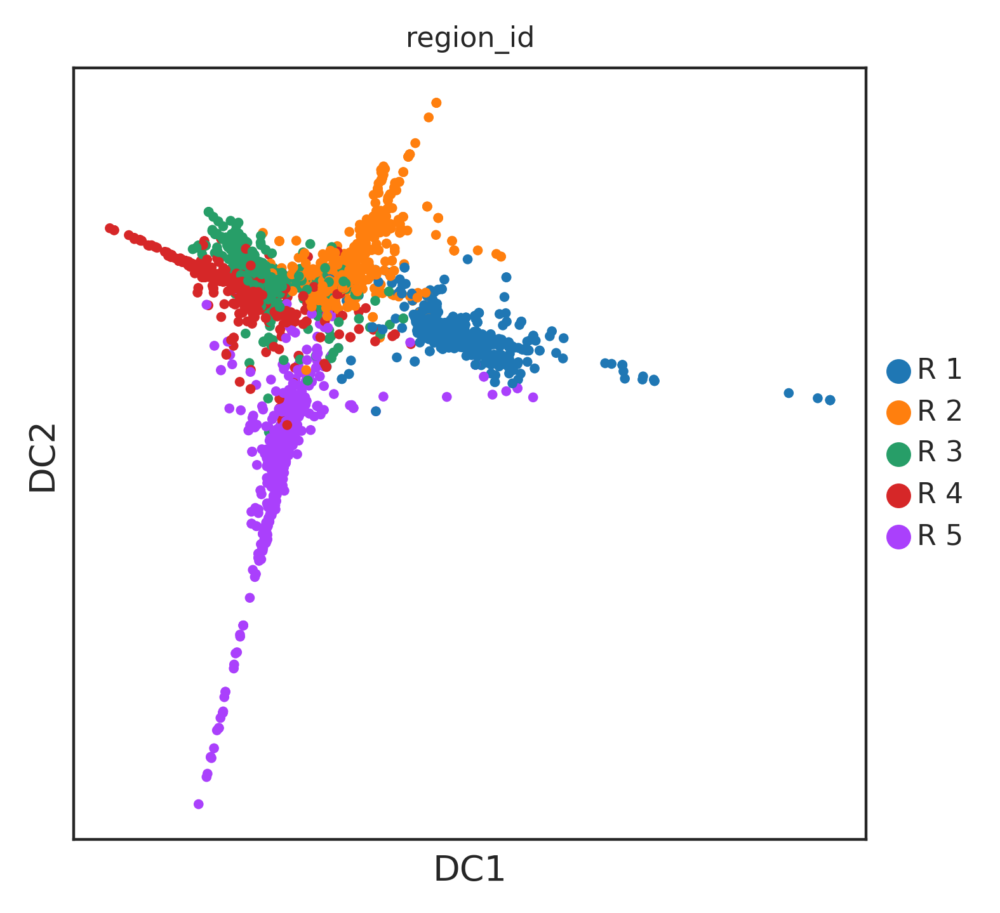

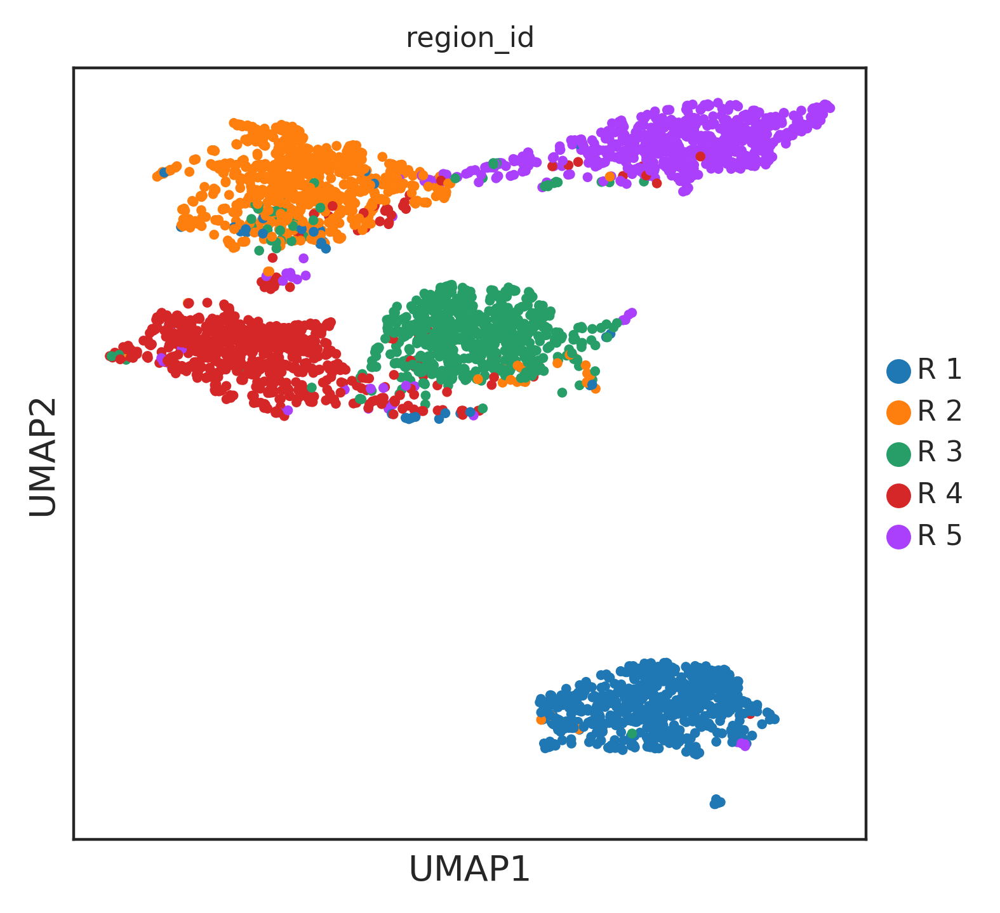

In [87]:
sc.pl.diffmap(adata,color=['region_id'])
sc.pl.umap(adata,color=['region_id'])